<a href="https://colab.research.google.com/github/sandhrasunnyk009/INSE6220_HeartDisease/blob/main/Principal_Component_Analysis_and_Diagnosis_of_Breast_Cancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and diagnosis of Breast cancer**

**Install Pycaret**

In [3]:
!pip install pycaret==2.3.6


  Using cached pycaret-2.3.6-py3-none-any.whl.metadata (11 kB)
  Using cached scipy-1.5.4.tar.gz (25.2 MB)
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


**Import Libraries**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The “Breast Cancer diagnosis Data Set” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information about tumor attributes to diagnosed it as benign or malignant for breast cancer.

There are 5 attributes with 569 entries and one column for classification.
**0 represents Benign and 1 represents Malignant.**


All attributes are numerical and they are listed bellow:

1. mean_radius = MR
2. mean_texture = MT
3. mean_perimeter = MP
4. mean_area = MA
5. mean_smoothness = MS
6. diagnosis (Label)

The original dataset can be found on below link:
https://www.kaggle.com/datasets/theodoravalerie/breast-cancer-data





In [5]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/sandhrasunnyk009/INSE6220_HeartDisease/refs/heads/main/cleaned_merged_heart_dataset.csv')
df.head(25)

,age,sex,cp,trestbps,chol,fbs,restecg,thalachh,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


In [6]:
len(df.index)

1888

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1888 entries, 0 to 1887
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1888 non-null   int64  
 1   sex       1888 non-null   int64  
 2   cp        1888 non-null   int64  
 3   trestbps  1888 non-null   int64  
 4   chol      1888 non-null   int64  
 5   fbs       1888 non-null   int64  
 6   restecg   1888 non-null   int64  
 7   thalachh  1888 non-null   int64  
 8   exang     1888 non-null   int64  
 9   oldpeak   1888 non-null   float64
 10  slope     1888 non-null   int64  
 11  ca        1888 non-null   int64  
 12  thal      1888 non-null   int64  
 13  target    1888 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 206.6 KB


In [8]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  1286


In [9]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

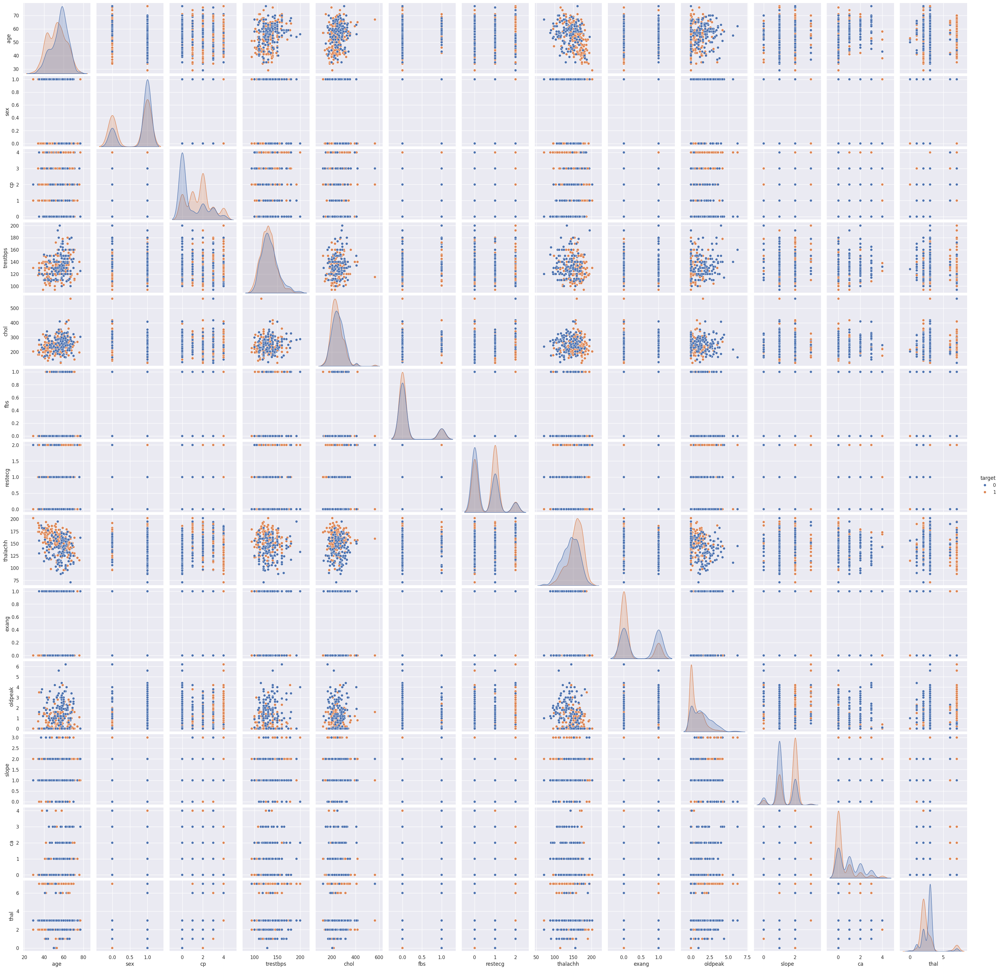

In [10]:
sns.pairplot(df, hue='target')
plt.show()

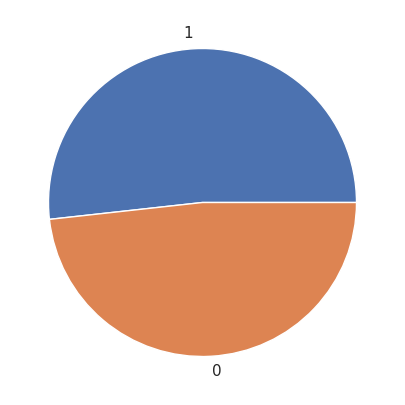

In [11]:
y =df['target']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [12]:
X = df.drop(columns=['target'])
X.head(10)

,age,sex,cp,trestbps,chol,fbs,restecg,thalachh,exang,oldpeak,slope,ca,thal
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,1888.0,54.354343,9.081505,29.0,47.75,55.0,61.0,77.0
sex,1888.0,0.688559,0.463205,0.0,0.00,1.0,1.0,1.0
cp,1888.0,1.279131,1.280877,0.0,0.00,1.0,2.0,4.0
trestbps,1888.0,131.549258,17.556985,94.0,120.00,130.0,140.0,200.0
chol,1888.0,246.855403,51.609329,126.0,211.00,241.0,276.0,564.0
fbs,1888.0,0.148305,0.355496,0.0,0.00,0.0,0.0,1.0
restecg,1888.0,0.597458,0.638820,0.0,0.00,1.0,1.0,2.0
thalachh,1888.0,149.424258,23.006153,71.0,133.00,152.0,166.0,202.0
exang,1888.0,0.331568,0.470901,0.0,0.00,0.0,1.0,1.0
oldpeak,1888.0,1.053761,1.161344,0.0,0.00,0.8,1.6,6.2


**Standardize the Data**

In [14]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,age,sex,cp,trestbps,chol,fbs,restecg,thalachh,exang,oldpeak,slope,ca,thal
0,0.952259,0.672538,1.343864,0.766322,-0.268538,2.396426,-0.935500,0.025032,-0.70430,1.073386,-2.295053,-0.720321,-1.330518
1,-1.911461,0.672538,0.562942,-0.088265,0.060947,-0.417288,0.630301,1.633724,-0.70430,2.106945,-2.295053,-0.720321,-0.530257
2,-1.470888,-1.486904,-0.217980,-0.088265,-0.830601,-0.417288,-0.935500,0.981551,-0.70430,0.298216,0.933755,-0.720321,-0.530257
3,0.181258,0.672538,-0.217980,-0.657990,-0.210394,-0.417288,0.630301,1.242420,-0.70430,-0.218564,0.933755,-0.720321,-0.530257
4,0.291401,-1.486904,-0.998902,-0.657990,2.076620,-0.417288,0.630301,0.590248,1.41985,-0.390824,0.933755,-0.720321,-0.530257
5,0.291401,0.672538,-0.998902,0.481460,-1.063179,-0.417288,0.630301,-0.061924,-0.70430,-0.563084,-0.680649,-0.720321,-1.330518
6,0.181258,-1.486904,-0.217980,0.481460,0.913732,-0.417288,-0.935500,0.155467,-0.70430,0.212086,-0.680649,-0.720321,-0.530257
7,-1.140459,0.672538,-0.217980,-0.657990,0.312906,-0.417288,0.630301,1.025030,-0.70430,-0.907604,0.933755,-0.720321,0.270003
8,-0.259315,0.672538,0.562942,2.304579,-0.927508,2.396426,0.630301,0.546770,-0.70430,-0.476954,0.933755,-0.720321,0.270003
9,0.291401,0.672538,0.562942,1.051184,-1.528334,-0.417288,0.630301,1.068508,-0.70430,0.470476,0.933755,-0.720321,-0.530257


In [15]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,1888.0,3.763468e-17,1.000265,-2.792605,-0.727423,0.071115,0.731973,2.494262
sex,1888.0,-1.590065e-16,1.000265,-1.486904,-1.486904,0.672538,0.672538,0.672538
cp,1888.0,4.516161e-17,1.000265,-0.998902,-0.998902,-0.217980,0.562942,2.124786
trestbps,1888.0,-3.198948e-16,1.000265,-2.139274,-0.657990,-0.088265,0.481460,3.899808
chol,1888.0,1.881734e-16,1.000265,-2.342356,-0.694931,-0.113486,0.564865,6.146730
fbs,1888.0,-1.693561e-17,1.000265,-0.417288,-0.417288,-0.417288,-0.417288,2.396426
restecg,1888.0,1.053771e-16,1.000265,-0.935500,-0.935500,0.630301,0.630301,2.196102
thalachh,1888.0,-2.446254e-16,1.000265,-3.409742,-0.714096,0.111988,0.720683,2.285896
exang,1888.0,5.457028e-17,1.000265,-0.704300,-0.704300,-0.704300,1.419850,1.419850
oldpeak,1888.0,7.950326e-17,1.000265,-0.907604,-0.907604,-0.218564,0.470476,4.432454


**Observations and variables**

In [16]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

<ipython-input-17-774acb9c9bc7>:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


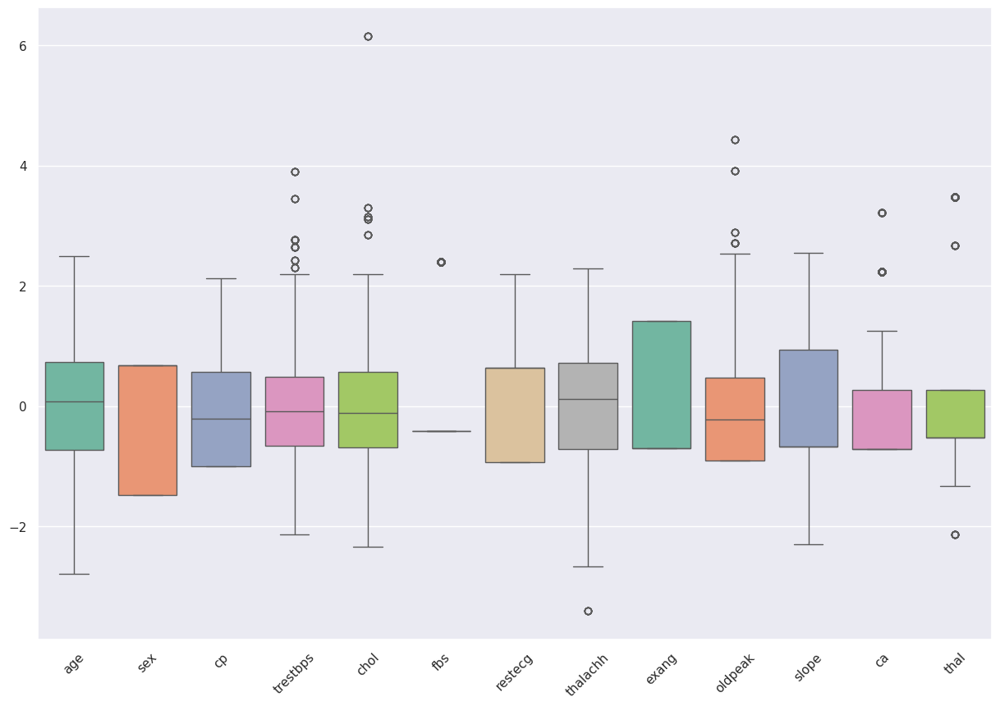

In [17]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

<ipython-input-18-4bf14a5cb8bc>:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


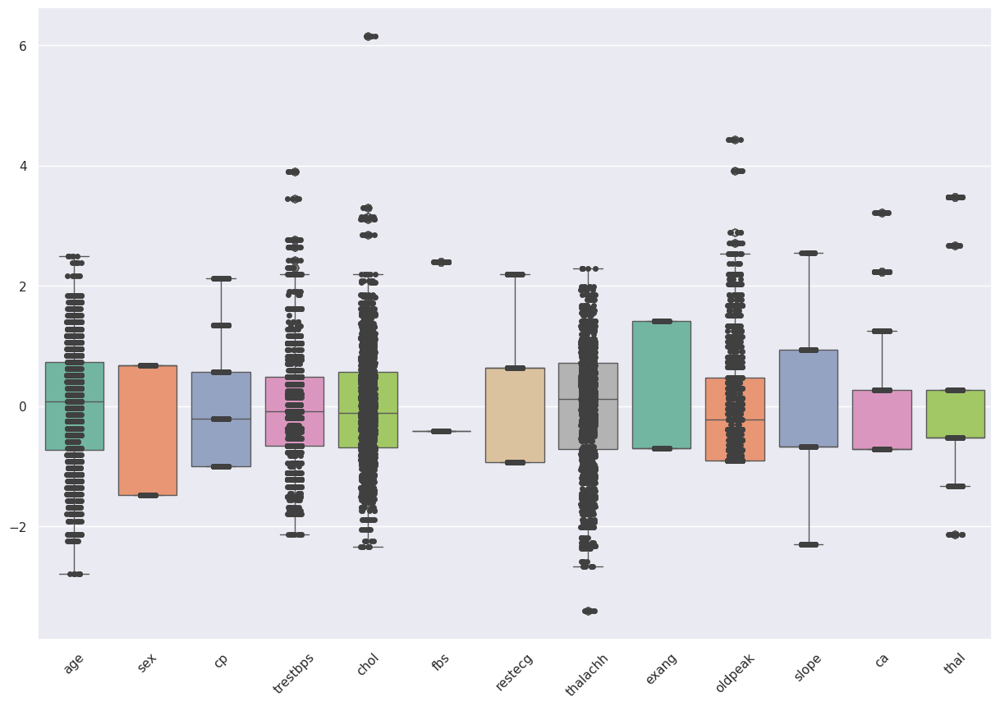

In [18]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

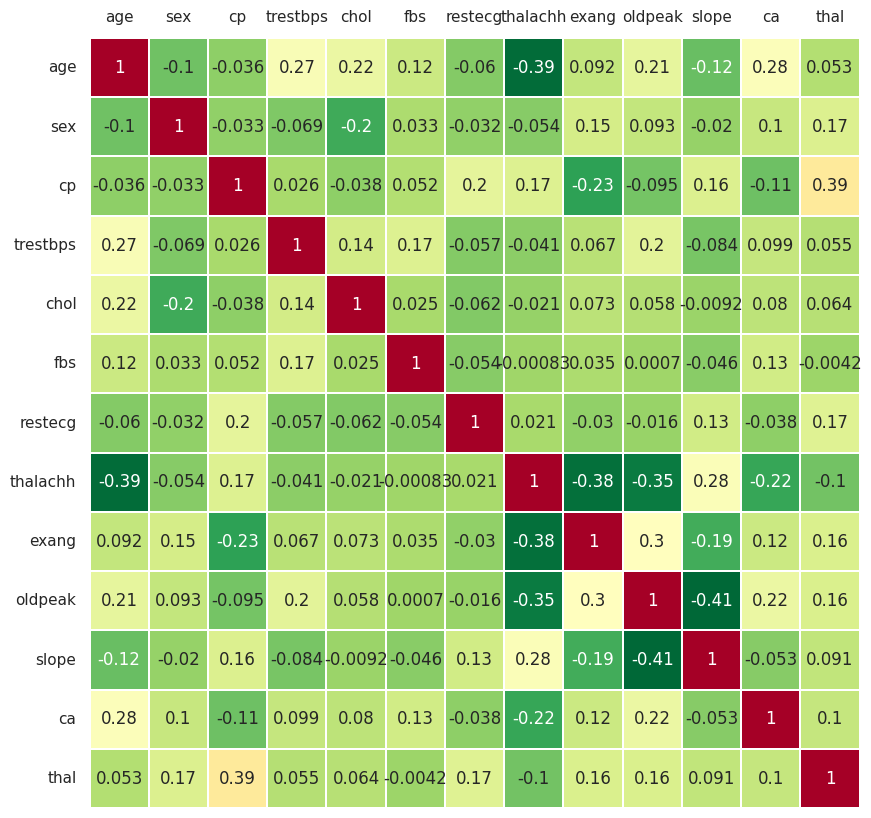

In [19]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

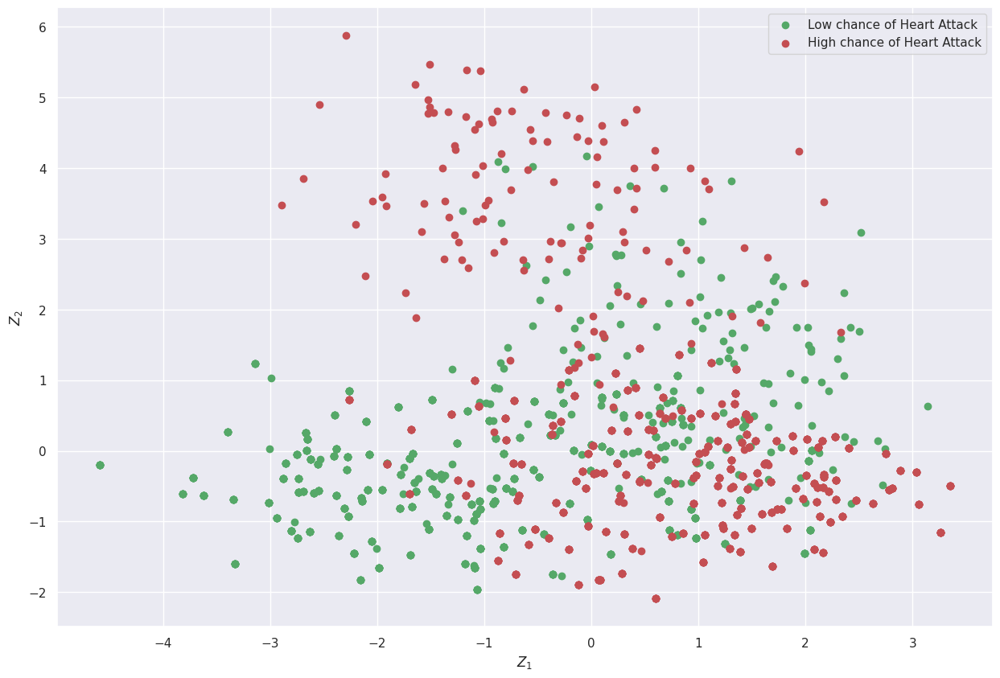

In [20]:
pca = PCA()
Z = pca.fit_transform(X)

# (Malignant)->1,  (Benign)->0

idx_Low_HA= np.where(y == 0)
idx_High_HA = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Low_HA,0], Z[idx_Low_HA,1], c='g', label='Low chance of Heart Attack')
plt.scatter(Z[idx_High_HA,0], Z[idx_High_HA,1], c='r', label='High chance of Heart Attack')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[-0.36682253,  0.11955796, -0.36757661, -0.03898063,  0.19616951,
        -0.28350459, -0.1745184 , -0.13300064, -0.3254227 ,  0.32782677,
         0.0450763 , -0.21800926,  0.53346197],
       [-0.06946405,  0.0990242 ,  0.51067141,  0.46401071,  0.11784873,
         0.20420816, -0.14915544,  0.16219663, -0.04684575,  0.62058944,
        -0.01436904, -0.10621999, -0.0794884 ],
       [ 0.19598782,  0.57597832, -0.06875307, -0.00465936, -0.27885818,
        -0.03331024, -0.21918391, -0.30678576, -0.03757934, -0.05498962,
        -0.149101  , -0.53563314, -0.30081304],
       [-0.22054694,  0.1476118 , -0.3846755 ,  0.19322694, -0.35449934,
         0.12403587,  0.05507528,  0.61416754, -0.36151935, -0.03345555,
        -0.18758173,  0.1228297 , -0.20218462],
       [-0.14197934,  0.06125804, -0.44947955, -0.28540109,  0.21739399,
         0.54150959,  0.07660954, -0.06558215,  0.3921385 ,  0.37342014,
         0.00631221, -0.01036691, -0.22040495],
       [-0.10334572,  0.096267

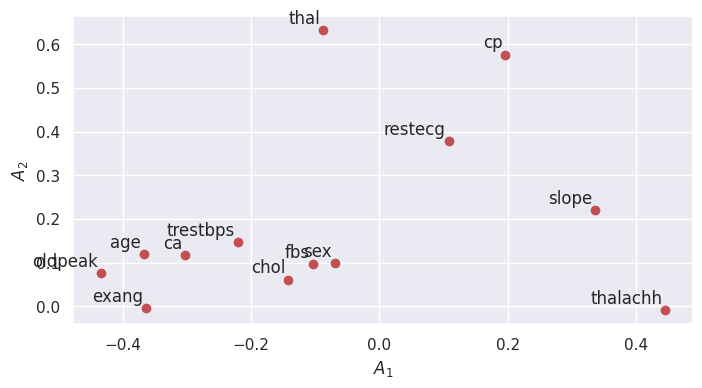

In [21]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


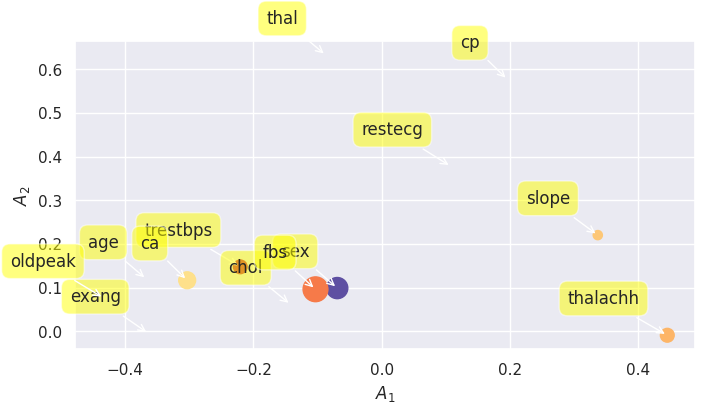

In [22]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([2.47079609, 1.58859369, 1.45974151, 1.13417731, 1.02066085,
       0.92822478, 0.85550214, 0.79381418, 0.77318784, 0.63884089,
       0.49047543, 0.42954355, 0.423331  ])

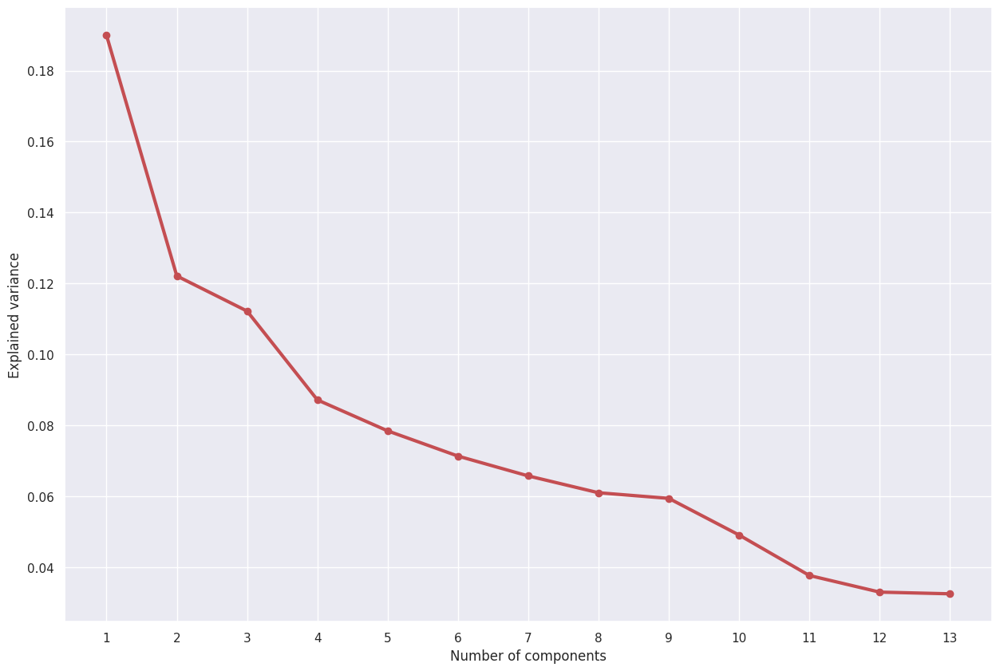

In [23]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

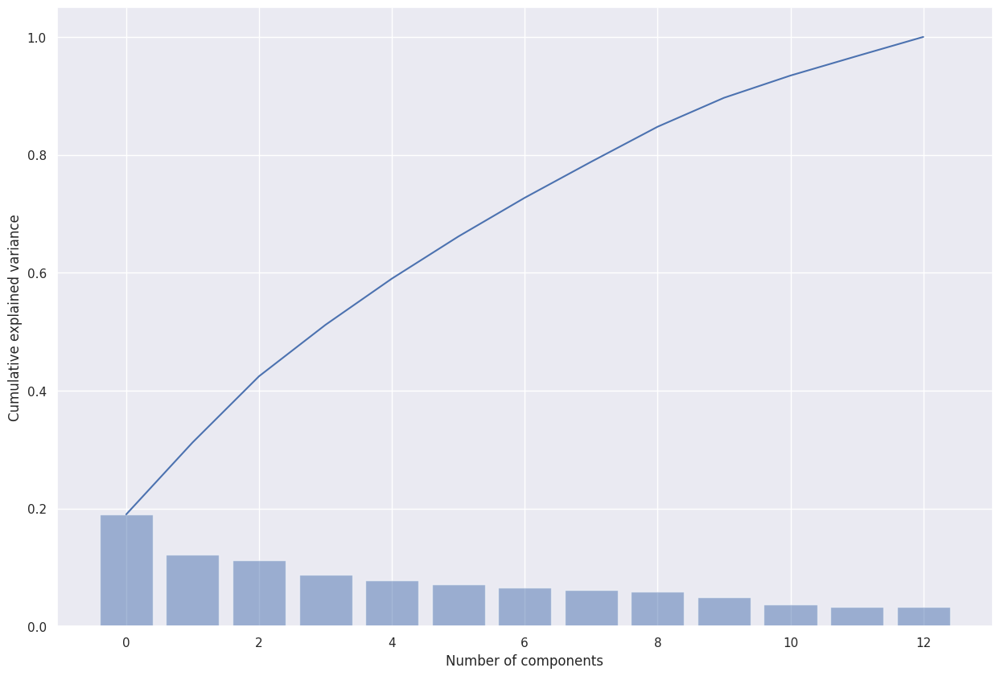

In [24]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-0.41593546, -0.42427643, -1.10173499, ...,  1.06764389,
       -0.45542499, -0.23038742])

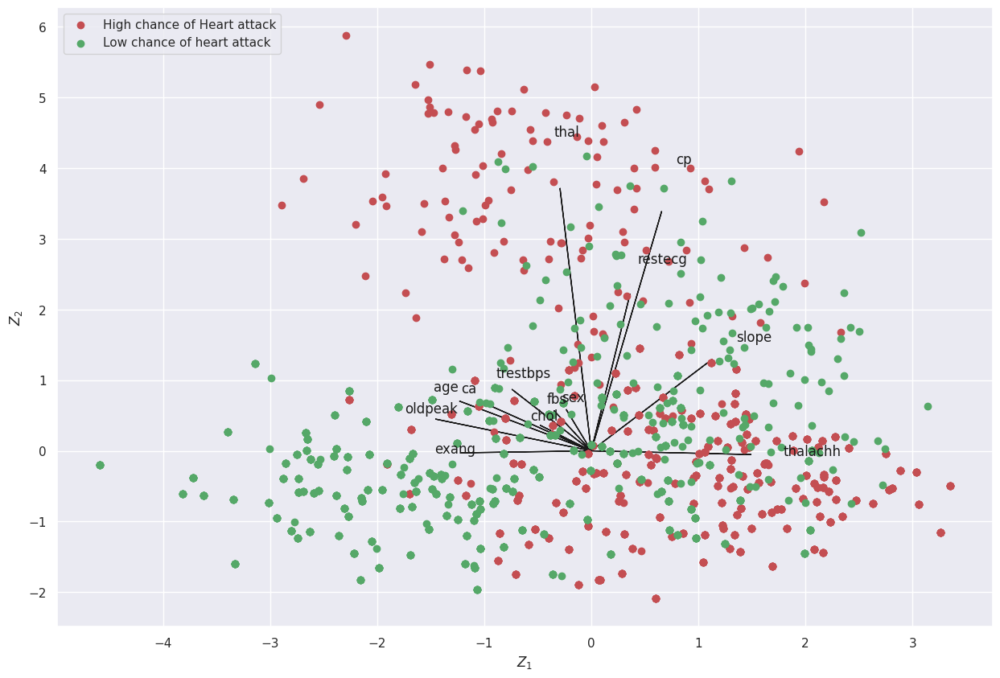

In [25]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_High_HA,0], Z[idx_High_HA,1], c='r', label='High chance of Heart attack')
plt.scatter(Z[idx_Low_HA,0], Z[idx_Low_HA,1], c='g', label='Low chance of heart attack')
plt.legend()
#

plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [26]:
!pip install pca

In [27]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [13] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [12] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[12]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [28]:
out['PC']

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-1.248481,-0.415935,-0.921018,1.920063,-2.895093,-0.667626,-0.224186,-1.353114,0.314806,1.237725,0.152716,-0.995679
1,0.448484,-0.424276,1.302539,-0.358443,-2.981894,0.409466,-0.580824,0.881896,2.381608,0.549610,0.257703,-0.500483
2,1.822286,-1.101735,-0.271501,-0.257388,-0.688433,0.251490,-0.307757,0.331503,-0.123242,-1.685970,1.029932,0.182035
3,1.612938,-0.187633,0.245296,0.016012,0.396062,-0.189528,-0.064039,0.582995,0.021400,0.935827,0.700570,-0.444462
4,0.256898,-0.715516,-1.197039,-1.956373,1.291782,1.178386,1.721071,0.040908,0.380652,-0.017138,0.281184,-0.568470
...,...,...,...,...,...,...,...,...,...,...,...,...
1883,-1.367593,-0.343378,0.842099,0.452695,0.835038,0.590613,-0.055066,0.685228,-1.388726,-0.661731,0.668636,-0.246950
1884,-2.072244,-0.053623,0.928072,-0.548057,0.734020,0.796924,0.733421,0.918731,0.964613,0.026885,-0.663184,0.418094
1885,0.803006,1.067644,-0.034403,0.770769,0.646076,-1.216729,-0.960186,0.782901,-0.043737,0.053810,-0.189088,-1.203825
1886,0.837680,-0.455425,-0.667771,1.164658,0.394502,0.424461,-0.822625,1.160716,-0.982769,0.102003,-0.282970,0.040142


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '12 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (18.9% expl.var)', ylabel='PC2 (12.2% expl.var)'>)

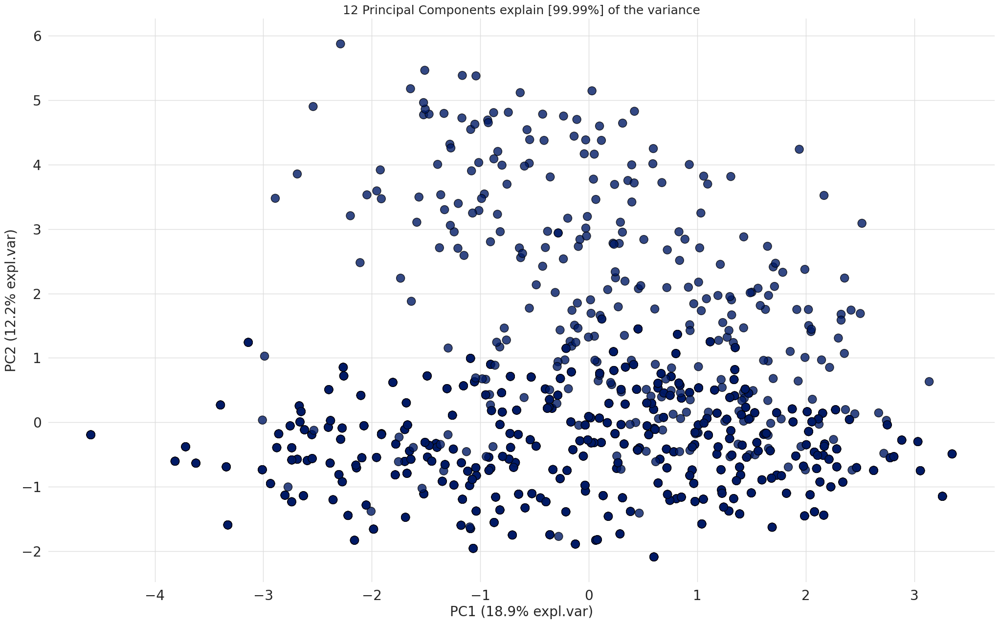

In [29]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [30]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
age,-0.366823,0.119558,-0.367577,-0.038981,0.196170,-0.283505,-0.174518,-0.133001,-0.325423,0.327827,0.045076,-0.218009
sex,-0.069464,0.099024,0.510671,0.464011,0.117849,0.204208,-0.149155,0.162197,-0.046846,0.620589,-0.014369,-0.106220
cp,0.195988,0.575978,-0.068753,-0.004659,-0.278858,-0.033310,-0.219184,-0.306786,-0.037579,-0.054990,-0.149101,-0.535633
trestbps,-0.220547,0.147612,-0.384675,0.193227,-0.354499,0.124036,0.055075,0.614168,-0.361519,-0.033456,-0.187582,0.122830
chol,-0.141979,0.061258,-0.449480,-0.285401,0.217394,0.541510,0.076610,-0.065582,0.392138,0.373420,0.006312,-0.010367
fbs,-0.103346,0.096267,-0.236212,0.636667,-0.145865,-0.095720,0.517326,-0.371820,0.182870,0.008599,0.195602,0.103986
restecg,0.107930,0.377185,0.128461,-0.313266,0.025725,-0.474934,0.491900,0.339294,0.247929,0.283632,-0.073463,0.010871
thalachh,0.444978,-0.008886,-0.146353,0.197091,-0.155327,0.253979,-0.046561,0.303975,0.330829,-0.064019,-0.042215,-0.266991
exang,-0.363607,-0.004787,0.285803,-0.098456,0.120472,0.349205,0.507900,-0.016725,-0.174063,-0.286382,-0.232847,-0.437245
oldpeak,-0.433509,0.076310,0.158737,-0.119950,-0.327703,0.002688,-0.154676,0.191587,0.271364,-0.119941,0.691878,-0.178214


<ipython-input-31-0d0b20fc150e>:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],


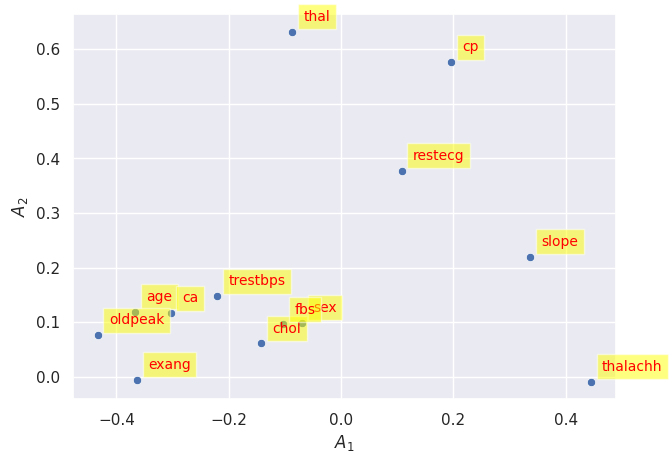

In [31]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))


**Scree Plot**

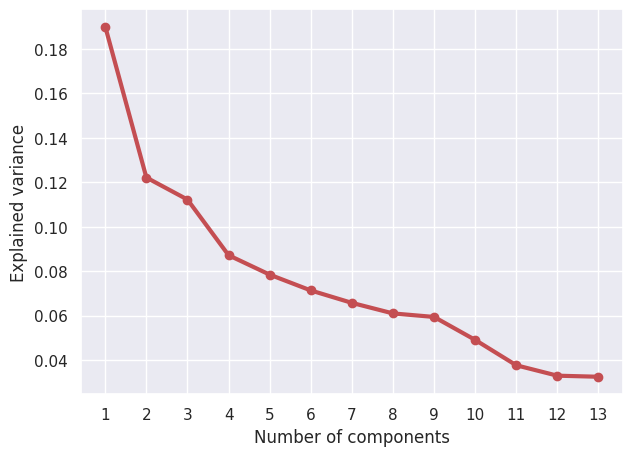

In [32]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

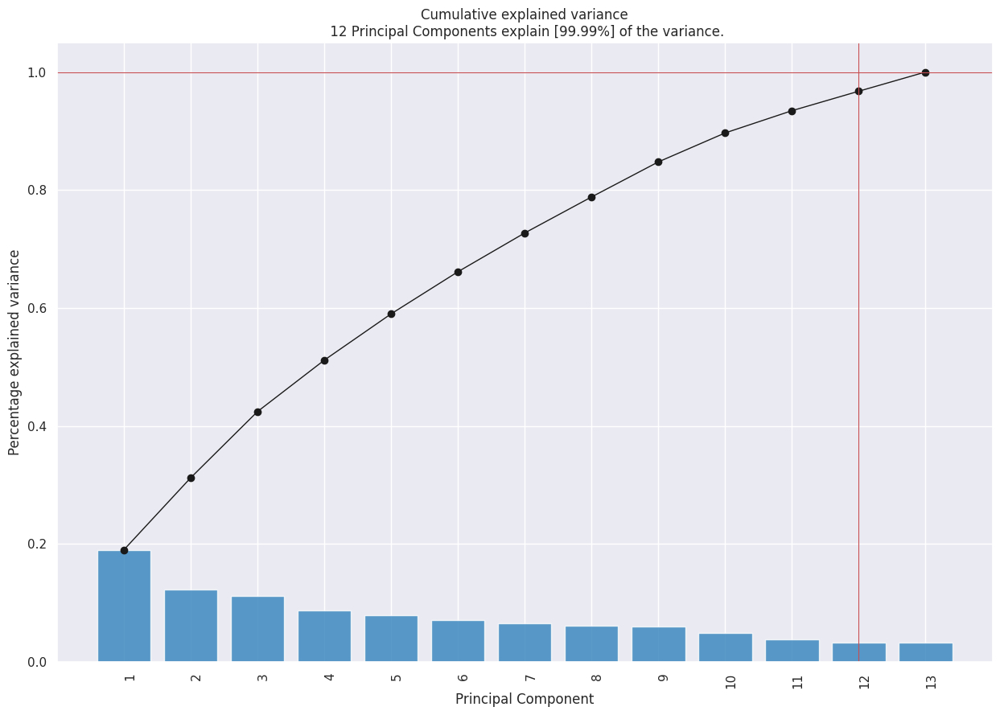

In [33]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '12 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (18.9% expl.var)', ylabel='PC2 (12.2% expl.var)'>)

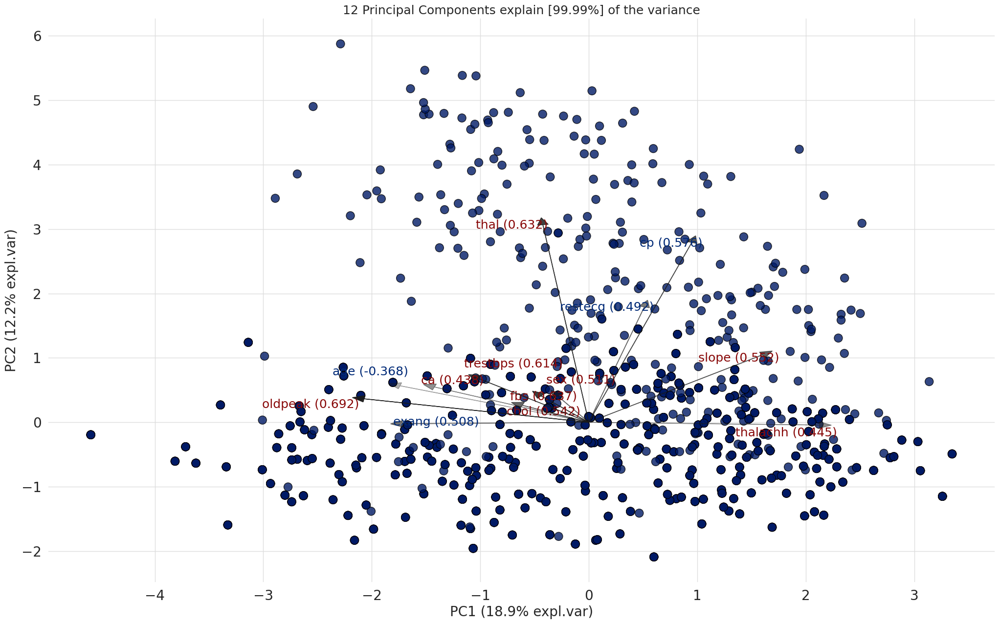

In [34]:
model.biplot(label=False, legend=False, color_arrow='k')

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '12 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (18.9% expl.var)', ylabel='PC2 (12.2% expl.var)', zlabel='PC3 (11.2% expl.var)'>)

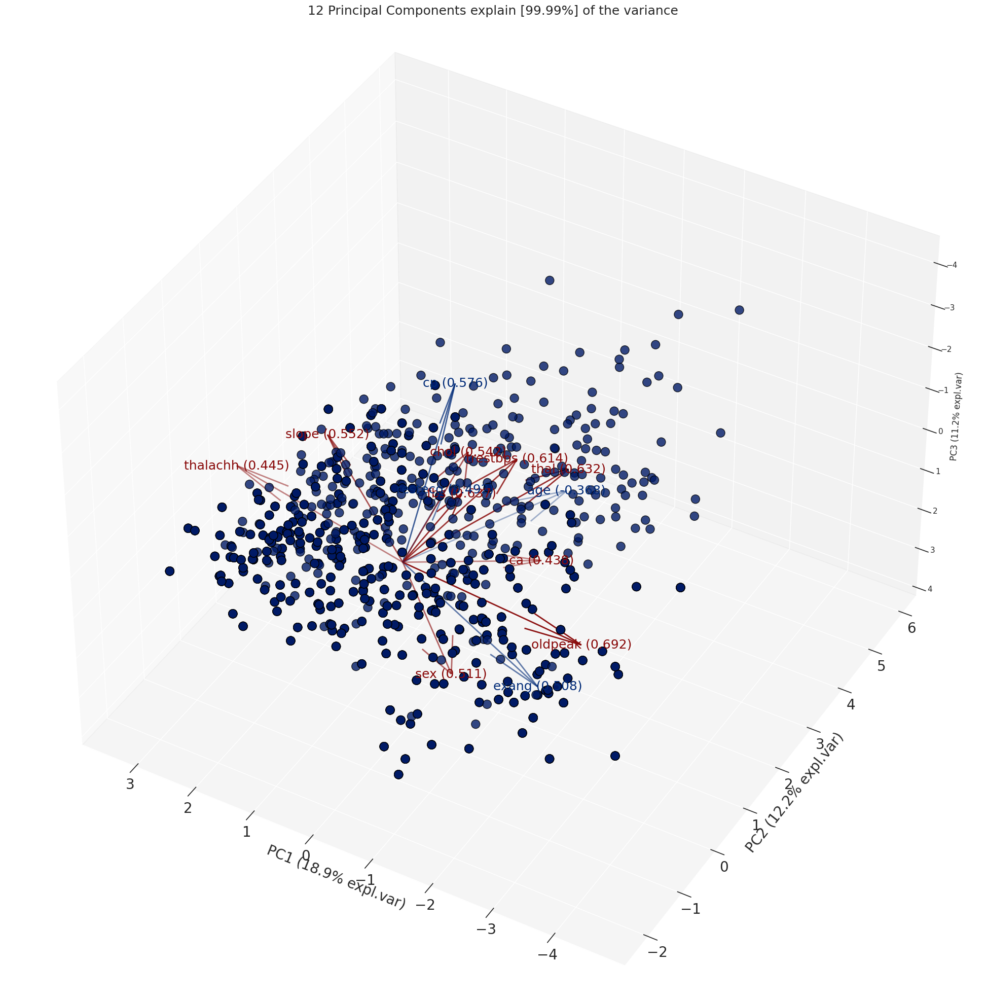

In [37]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found.
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [9]:
!pip install pycaret[full]

In [10]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.3.2'

In [11]:
#For Google Colab only
from pycaret.utils import enable_colab
enable_colab()

ImportError: cannot import name 'enable_colab' from 'pycaret.utils' (/usr/local/lib/python3.10/dist-packages/pycaret/utils/__init__.py)

In [8]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

NameError: name 'df' is not defined

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='target', train_size=0.7, session_id=123)

**Comparing All Models**

In [ ]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.9329,0.9843,0.9814,0.9193,0.9472,0.8553,0.8662,0.010
et,Extra Trees Classifier,0.9190,0.9769,0.9587,0.9180,0.9356,0.8262,0.8358,0.411
gbc,Gradient Boosting Classifier,0.9133,0.9732,0.9398,0.9216,0.9292,0.8170,0.8217,0.075
qda,Quadratic Discriminant Analysis,0.9131,0.9754,0.9766,0.8952,0.9323,0.8118,0.8244,0.011
lightgbm,Light Gradient Boosting Machine,0.9107,0.9803,0.9307,0.9263,0.9267,0.8118,0.8163,0.057
rf,Random Forest Classifier,0.9106,0.9772,0.9398,0.9179,0.9267,0.8113,0.8175,0.449
ada,Ada Boost Classifier,0.9079,0.9683,0.9305,0.9226,0.9240,0.8060,0.8127,0.081
dt,Decision Tree Classifier,0.9049,0.8931,0.9491,0.9052,0.9246,0.7955,0.8037,0.011
lr,Logistic Regression,0.8967,0.9692,0.9262,0.9103,0.9158,0.7814,0.7883,0.261
ridge,Ridge Classifier,0.8967,0.0000,0.9494,0.8926,0.9173,0.7792,0.7911,0.010


In [ ]:
best_model

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

 Create a Model

**Logistic Regresssion**

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8333,0.9708,0.9545,0.8077,0.8750,0.6301,0.6502
1,0.8056,0.9123,0.8636,0.8261,0.8444,0.5855,0.5866
2,0.8889,0.9351,0.9091,0.9091,0.9091,0.7662,0.7662
3,0.9444,0.9935,0.9545,0.9545,0.9545,0.8831,0.8831
4,0.8889,0.9903,0.8182,1.0000,0.9000,0.7778,0.7977
5,0.9444,0.9870,1.0000,0.9167,0.9565,0.8800,0.8864
6,0.9167,0.9937,0.9524,0.9091,0.9302,0.8269,0.8283
7,0.9444,0.9873,0.9048,1.0000,0.9500,0.8879,0.8935
8,0.8857,0.9252,0.9048,0.9048,0.9048,0.7619,0.7619
9,0.9143,0.9966,1.0000,0.8750,0.9333,0.8148,0.8292


**Tune the model**

In [ ]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9708,0.9545,0.8400,0.8936,0.6959,0.7078
1,0.8333,0.9091,0.8636,0.8636,0.8636,0.6494,0.6494
2,0.8611,0.9383,0.8636,0.9048,0.8837,0.7115,0.7127
3,0.9444,0.9935,0.9091,1.0000,0.9524,0.8861,0.8919
4,0.8611,0.9903,0.7727,1.0000,0.8718,0.7256,0.7546
5,0.9444,0.9870,0.9545,0.9545,0.9545,0.8831,0.8831
6,0.9722,0.9937,0.9524,1.0000,0.9756,0.9434,0.9449
7,0.9167,0.9841,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.8857,0.9286,0.9048,0.9048,0.9048,0.7619,0.7619
9,0.9143,0.9932,1.0000,0.8750,0.9333,0.8148,0.8292


In [ ]:
tuned_lr

LogisticRegression(C=2.833, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**


In [ ]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with K-nearest neighbour**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9708,0.9545,0.8400,0.8936,0.6959,0.7078
1,0.8333,0.8912,0.9545,0.8077,0.8750,0.6301,0.6502
2,0.7778,0.8701,0.8182,0.8182,0.8182,0.5325,0.5325
3,0.9444,0.9789,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9444,0.9708,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.8333,0.8864,0.9091,0.8333,0.8696,0.6400,0.6447
6,0.8056,0.8841,0.8571,0.8182,0.8372,0.5962,0.5971
7,0.8889,0.9381,0.9048,0.9048,0.9048,0.7714,0.7714
8,0.8000,0.8418,0.8095,0.8500,0.8293,0.5882,0.5893
9,0.8857,0.9660,1.0000,0.8400,0.9130,0.7500,0.7746


**Tune model with K-nearest neighbour**

In [ ]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9545,1.0000,0.8462,0.9167,0.7534,0.7774
1,0.8611,0.8929,1.0000,0.8148,0.8980,0.6875,0.7237
2,0.8889,0.8896,0.9545,0.8750,0.9130,0.7600,0.7655
3,0.9167,1.0000,1.0000,0.8800,0.9362,0.8176,0.8315
4,0.9444,0.9692,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9675,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.8333,0.9143,0.9048,0.8261,0.8636,0.6505,0.6549
7,0.9444,0.9810,0.9524,0.9524,0.9524,0.8857,0.8857
8,0.8571,0.8605,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.8857,0.9660,1.0000,0.8400,0.9130,0.7500,0.7746


In [ ]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=29, p=2,
                     weights='distance')

**Evaluate model with K-nearest neighbour**

In [ ]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with Quadratic Discriminant Analysis**

In [ ]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,1.0000,0.8462,0.9167,0.7534,0.7774
1,0.9167,0.9448,1.0000,0.8800,0.9362,0.8176,0.8315
2,0.9167,0.9513,1.0000,0.8800,0.9362,0.8176,0.8315
3,0.9444,1.0000,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9444,0.9805,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,1.0000,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9167,0.9778,0.9524,0.9091,0.9302,0.8269,0.8283
7,0.9722,0.9937,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8286,0.9286,0.9524,0.8000,0.8696,0.6250,0.6455
9,0.8857,1.0000,1.0000,0.8400,0.9130,0.7500,0.7746


**Tune QDA Model**

In [ ]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9643,1.0000,0.8148,0.8980,0.6875,0.7237
1,0.8333,0.9318,0.8636,0.8636,0.8636,0.6494,0.6494
2,0.8889,0.9416,0.9545,0.8750,0.9130,0.7600,0.7655
3,0.9444,0.9903,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.8889,0.9805,0.8182,1.0000,0.9000,0.7778,0.7977
5,0.9167,0.9968,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.8889,0.9810,0.9524,0.8696,0.9091,0.7670,0.7722
7,0.9167,0.9841,0.9048,0.9500,0.9268,0.8302,0.8315
8,0.8857,0.9218,0.9524,0.8696,0.9091,0.7561,0.7618
9,0.8857,0.9966,1.0000,0.8400,0.9130,0.7500,0.7746


**Evaluate QDA Model**

In [ ]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='diagnosis', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,diagnosis
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(512, 6)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


# **Comparing Models**

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9300,0.9852,0.9535,0.9349,0.9427,0.8523,0.8565,0.035
knn,K Neighbors Classifier,0.9161,0.9591,0.9537,0.9155,0.9326,0.8213,0.8277,0.141
qda,Quadratic Discriminant Analysis,0.9160,0.9823,0.9580,0.9125,0.9326,0.8209,0.8289,0.022
et,Extra Trees Classifier,0.9134,0.9708,0.9491,0.9147,0.9297,0.8164,0.8238,0.490
nb,Naive Bayes,0.9133,0.9769,0.9539,0.9117,0.9308,0.8148,0.8213,0.019
gbc,Gradient Boosting Classifier,0.9132,0.9695,0.9351,0.9273,0.9286,0.8171,0.8241,0.108
svm,SVM - Linear Kernel,0.9106,0.0000,0.9400,0.9183,0.9275,0.8105,0.8151,0.027
ridge,Ridge Classifier,0.9106,0.0000,0.9907,0.8828,0.9318,0.8036,0.8217,0.016
rf,Random Forest Classifier,0.9106,0.9714,0.9353,0.9210,0.9265,0.8120,0.8168,0.562
lightgbm,Light Gradient Boosting Machine,0.9106,0.9604,0.9305,0.9263,0.9260,0.8123,0.8190,0.053


# **Best model with PCA**

In [ ]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Tune Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.8889,0.9578,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,1.0000,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9444,0.9968,1.0000,0.9167,0.9565,0.8800,0.8864
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9626,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9429,0.9966,1.0000,0.9130,0.9545,0.8780,0.8847


# **Evaluate Best Model**

In [ ]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9805,0.9545,0.9130,0.9333,0.8224,0.8238
1,0.8889,0.9610,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,0.9968,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9903,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.8571,0.9626,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.9429,1.0000,1.0000,0.9130,0.9545,0.8780,0.8847


# **Tune Model**

In [ ]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9773,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.8889,0.9578,0.9545,0.8750,0.9130,0.7600,0.7655
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9444,1.0000,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9444,0.9968,1.0000,0.9167,0.9565,0.8800,0.8864
6,0.9722,0.9968,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9626,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9429,0.9966,1.0000,0.9130,0.9545,0.8780,0.8847


# **Evaluate Model**

In [ ]:
tuned_lr_pca

LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [ ]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8611,0.9594,0.9545,0.8400,0.8936,0.6959,0.7078
1,0.8889,0.9156,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.8889,0.9383,0.9091,0.9091,0.9091,0.7662,0.7662
3,0.9722,0.9578,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.9444,0.9968,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.9167,0.9854,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9444,0.9603,1.0000,0.9130,0.9545,0.8835,0.8896
7,0.9444,0.9714,0.9048,1.0000,0.9500,0.8879,0.8935
8,0.8571,0.9269,0.9048,0.8636,0.8837,0.6988,0.7001
9,0.9429,0.9796,1.0000,0.9130,0.9545,0.8780,0.8847


# **Tune Model**

In [ ]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8889,0.9821,0.9545,0.8750,0.9130,0.7600,0.7655
1,0.9167,0.9188,1.0000,0.8800,0.9362,0.8176,0.8315
2,0.9167,0.9334,0.9545,0.9130,0.9333,0.8224,0.8238
3,0.9722,0.9935,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.8889,1.0000,0.8182,1.0000,0.9000,0.7778,0.7977
5,0.9167,0.9919,0.9545,0.9130,0.9333,0.8224,0.8238
6,0.9722,0.9952,1.0000,0.9545,0.9767,0.9423,0.9439
7,0.9722,0.9968,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8857,0.9524,1.0000,0.8400,0.9130,0.7500,0.7746
9,0.9714,0.9983,1.0000,0.9545,0.9767,0.9398,0.9415


In [ ]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=16, p=2,
                     weights='uniform')

# **Evaluate Model KNN**

In [ ]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create Quadratic Discriminant Analysis Model**

In [ ]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9740,1.0000,0.8800,0.9362,0.8176,0.8315
1,0.8611,0.9513,0.9545,0.8400,0.8936,0.6959,0.7078
2,0.9444,0.9643,1.0000,0.9167,0.9565,0.8800,0.8864
3,0.9722,1.0000,1.0000,0.9565,0.9778,0.9408,0.9424
4,0.9167,0.9968,0.8636,1.0000,0.9268,0.8312,0.8433
5,0.9167,0.9903,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9167,0.9937,0.9524,0.9091,0.9302,0.8269,0.8283
7,0.9444,1.0000,0.9048,1.0000,0.9500,0.8879,0.8935
8,0.8571,0.9626,0.9524,0.8333,0.8889,0.6914,0.7035
9,0.9143,0.9898,0.9524,0.9091,0.9302,0.8193,0.8208


# **Tune model**

In [ ]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9805,1.0000,0.8800,0.9362,0.8176,0.8315
1,0.8889,0.9513,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.9167,0.9643,1.0000,0.8800,0.9362,0.8176,0.8315
3,0.9444,1.0000,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9167,1.0000,0.8636,1.0000,0.9268,0.8312,0.8433
5,0.9167,0.9903,1.0000,0.8800,0.9362,0.8176,0.8315
6,0.9444,0.9968,1.0000,0.9130,0.9545,0.8835,0.8896
7,0.9722,1.0000,0.9524,1.0000,0.9756,0.9434,0.9449
8,0.8286,0.9592,0.9524,0.8000,0.8696,0.6250,0.6455
9,0.9143,0.9898,1.0000,0.8750,0.9333,0.8148,0.8292


# **Evaluate Model**

In [ ]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.17,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As none of the the best three models with highest accuracy (LR, KNN, QDA) based on tree, I chose the fourth best model "Extra trees classifier" for the AI Shapley analysis.

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9167,0.9773,0.9545,0.9130,0.9333,0.8224,0.8238
1,0.8889,0.9448,1.0000,0.8462,0.9167,0.7534,0.7774
2,0.8889,0.9416,0.9091,0.9091,0.9091,0.7662,0.7662
3,0.9444,0.9935,1.0000,0.9167,0.9565,0.8800,0.8864
4,0.9444,0.9903,0.9091,1.0000,0.9524,0.8861,0.8919
5,0.8889,0.9870,0.9091,0.9091,0.9091,0.7662,0.7662
6,0.9444,0.9921,0.9524,0.9524,0.9524,0.8857,0.8857
7,0.8889,0.9651,0.8571,0.9474,0.9000,0.7757,0.7806
8,0.8857,0.9269,1.0000,0.8400,0.9130,0.7500,0.7746
9,0.9429,0.9898,1.0000,0.9130,0.9545,0.8780,0.8847


In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9444,0.9870,0.9545,0.9545,0.9545,0.8831,0.8831
1,0.8611,0.9643,0.9091,0.8696,0.8889,0.7039,0.7052
2,0.8611,0.9610,0.8636,0.9048,0.8837,0.7115,0.7127
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.8889,1.0000,0.8182,1.0000,0.9000,0.7778,0.7977
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9444,0.9968,0.9524,0.9524,0.9524,0.8857,0.8857
7,0.9167,1.0000,0.8571,1.0000,0.9231,0.8333,0.8452
8,0.9429,0.9592,0.9524,0.9524,0.9524,0.8810,0.8810
9,0.9714,1.0000,1.0000,0.9545,0.9767,0.9398,0.9415


In [ ]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features='log2', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.001,
                     min_impurity_split=None, min_samples_leaf=6,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

In [ ]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 6.9 MB/s 


In [ ]:
import shap

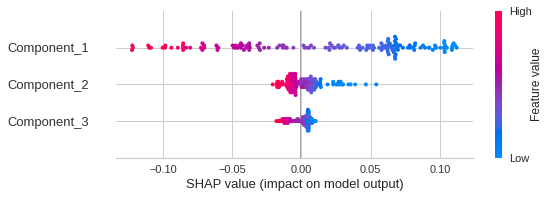

In [ ]:
interpret_model(tuned_et_pca, plot='summary')


In [ ]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

In [ ]:
interpret_model(tuned_et_pca, plot='reason')